# Five Inspirational Quotes From Famous Scientists

*Philip Abraham - April 24th, 2021*

"Scientists are an interesting breed of people, they are creative, adventurers, critical, and pragmatic. This may not be the initial subset of people you would look to for inspiration. However, think for an instance of the motivation required to tackle the great intellectual challenges of our time. Scientists are driven by constant curiosity and inspired to find truth."  
https://www.forbes.com/sites/trevornace/2016/03/06/20-inspirational-quotes-famous-scientists/?sh=7c0e55546f0e

The scientists quoted for the images shown below have left an invaluable influence in the trajectory of my life and career. 

**###########################################################################################################################**

### <span style='background :yellow' > "If I have seen further it is by standing on the shoulders of Giants." ― Isaac Newton </span>

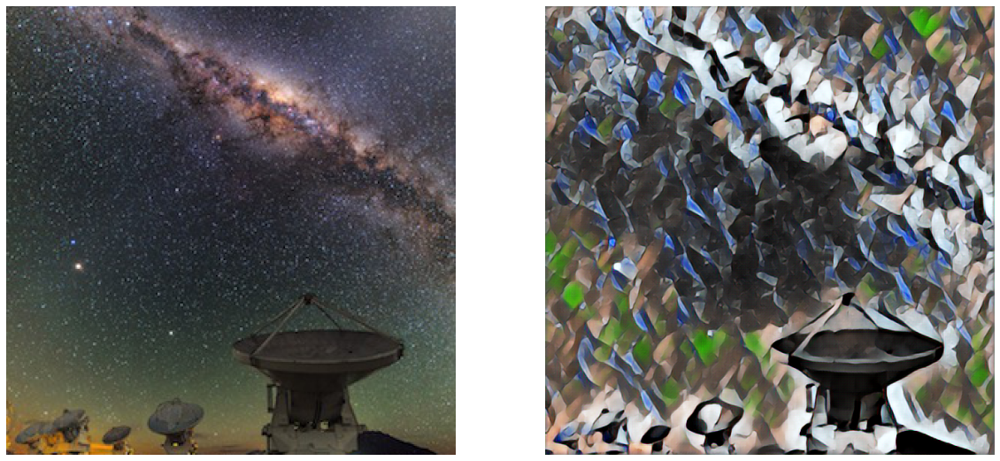

In [61]:
neural(4,udnie)

**###########################################################################################################################**

### <span style='background :yellow' > “A human being is a part of the whole called by us universe, a part limited in time and space. He experiences himself, his thoughts and feeling as something separated from the rest, a kind of optical delusion of his consciousness. This delusion is a kind of prison for us, restricting us to our personal desires and to affection for a few persons nearest to us. Our task must be to free ourselves from this prison by widening our circle of compassion to embrace all living creatures and the whole of nature in its beauty.” ― Albert Einstein</span>

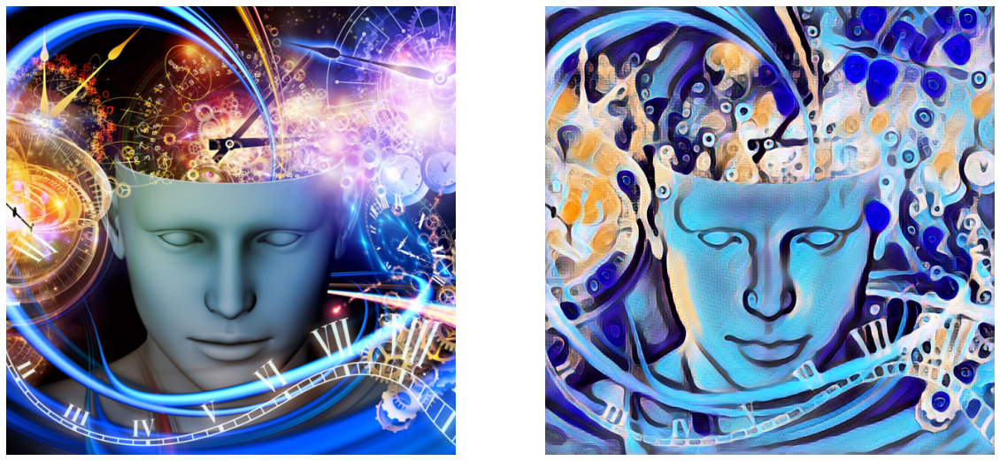

In [55]:
neural(0,candy)

**###########################################################################################################################**

### <span style='background :yellow' > "We pass through this world but once. Few tragedies can be more extensive than the stunting of life, few injustices deeper than the denial of an opportunity to strive or even to hope, by a limit imposed from without, but falsely identified as lying within". - Stephen Jay Gould </span>

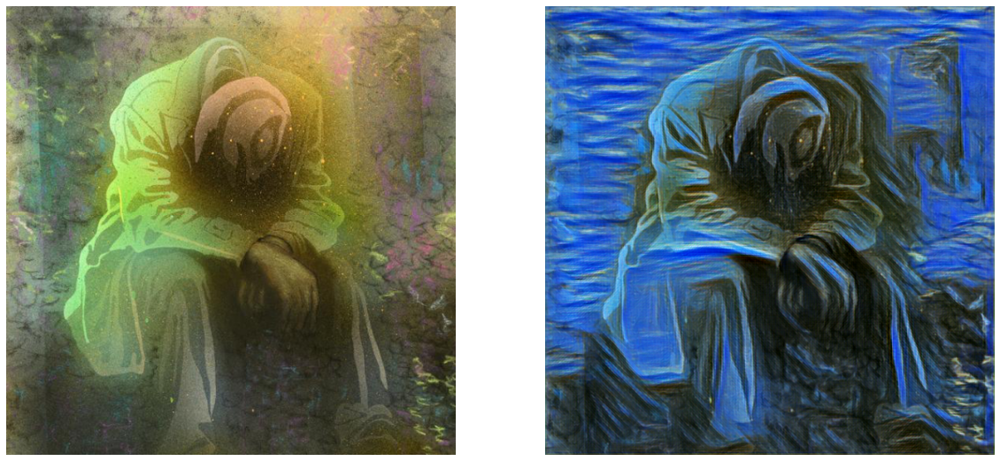

In [57]:
neural(2,scream)

**###########################################################################################################################**

### <span style='background :yellow' > "The objective world simply is, it does not happen. Only to the gaze of my consciousness, crawling upward along the life line of my body, does a section of this world come to life as a fleeting image in space which continuously changes in time." —Hermann Weyl, Philosophy of Mathematics and Natural Science (Princeton University Press, Princeton, 1949 </span>

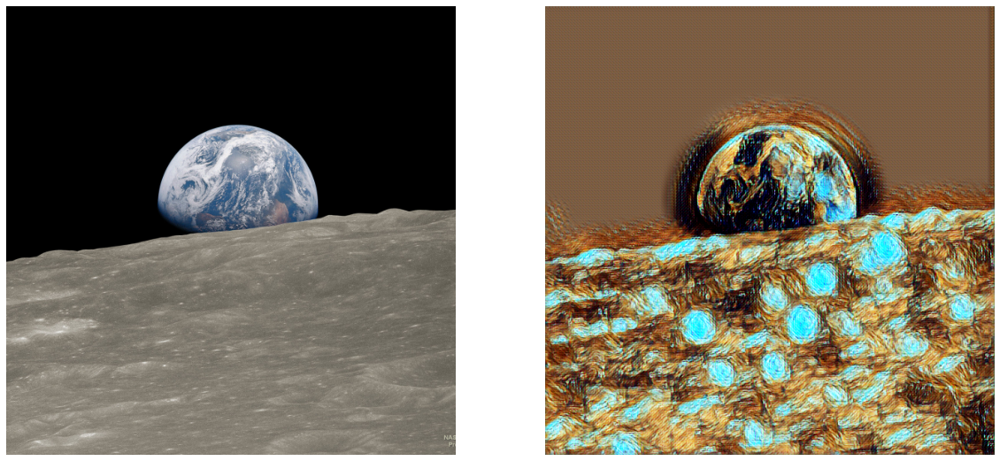

In [58]:
neural(3,starry)

**###########################################################################################################################**

### <span style='background :yellow' > "Nothing in life is to be feared, it is only to be understood. Now is the time to understand more, so that we may fear less." ― Marie Curie  </span>

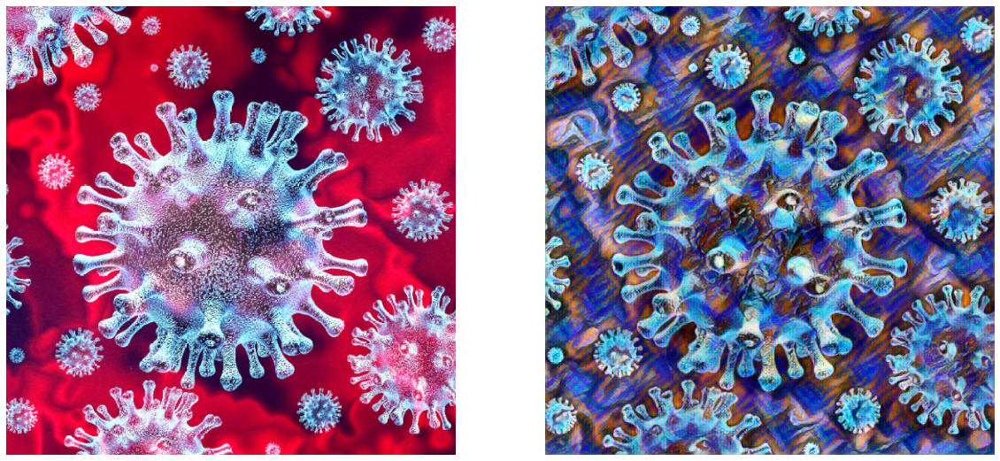

In [60]:
neural(1,composition)

**###########################################################################################################################**

## Appying Neural Style Transfer Methods - Code

**“What I cannot create, I do not understand.” - Richard Feynman**

In [1]:
from IPython.display import Image
Image(url='https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/opencv-neural-style/neural_style_transfer_animation.gif')

Reference: https://www.pyimagesearch.com/2018/08/27/neural-style-transfer-with-opencv/

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt

In [3]:
import datajoint as dj

In [4]:
schema = dj.schema('_neural_style_transfer')

Connecting root@localhost:3306


In [5]:
@schema
class Source(dj.Lookup):
    definition = """
    name : char(12)
    ---
    image_url : varchar(255)
    """
    
    contents = (
        ('milkyway', 'https://imagine.gsfc.nasa.gov/Images/objects/milkyway_sky_alma.jpg'),
        ('brain', 'https://wfneurology.org/public/images/uwNz-/iStock-453060741_brain%20space%20time.jpg'),
        ('despair', 'https://i.etsystatic.com/15738763/r/il/c8f7e4/2092732928/il_570xN.2092732928_nie2.jpg'),
        ('earthrise', 'https://apod.nasa.gov/apod/image/1812/Earthrise1_Apollo8AndersWeigang_2048.jpg'),
        ('covid19', 'https://cerid.uw.edu/sites/cerid.uw.edu/files/news_tiles/coronavirus-photo-1.jpg')
    )

In [7]:
Source()

name,image_url
brain,https://wfneurology.org/public/images/uwNz-/iStock-453060741_brain%20space%20time.jpg
covid19,https://cerid.uw.edu/sites/cerid.uw.edu/files/news_tiles/coronavirus-photo-1.jpg
despair,https://i.etsystatic.com/15738763/r/il/c8f7e4/2092732928/il_570xN.2092732928_nie2.jpg
earthrise,https://apod.nasa.gov/apod/image/1812/Earthrise1_Apollo8AndersWeigang_2048.jpg
milkyway,https://imagine.gsfc.nasa.gov/Images/objects/milkyway_sky_alma.jpg


In [8]:
import requests
import os

@schema
class Image(dj.Imported):
    definition = """
    -> Source
    ---
    image : longblob
    """
    
    def make(self, key):
        url = (Source & key).fetch1('image_url')
        tempfile = 'image.tmp'
        with open(tempfile, 'wb') as f:
            f.write(requests.get(url).content)
        self.insert1(dict(key, image=plt.imread(tempfile)))
        os.unlink(tempfile)

In [10]:
Image.populate(display_progress=True)

Image: 0it [00:00, ?it/s]


In [11]:
import numpy as np
import cv2
import imutils

In [12]:
@schema
class Crop(dj.Computed):
    definition = """
    -> Image
    ---
    cropped_image : longblob
    """
    
    def make(self, key):
        img = (Image & key).fetch1('image')
        sz = min((img.shape[:2]))
        sz1 = (img.shape[0] - sz)//2
        sz2 = (img.shape[1] - sz)//2
        img = imutils.resize(img[sz1:sz1+sz, sz2:sz2+sz], width=600, height=600)
        self.insert1(dict(key, cropped_image=img))

### Images Used

In [14]:
Crop.populate(display_progress=True)

Crop: 0it [00:00, ?it/s]


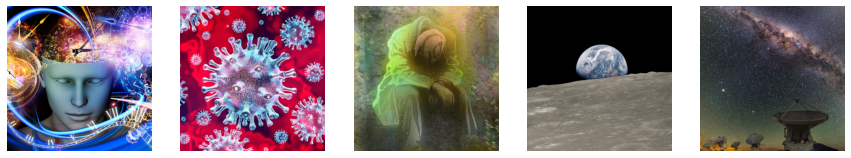

In [15]:
fig, ax = plt.subplots(1, len(Crop()), figsize=(len(Crop())*3,3))
for a, img in zip(ax, Crop.fetch('cropped_image')):
    a.imshow(img)
    a.axis(False)

### Art Styles Used

In [16]:
@schema
class Style(dj.Lookup):
    definition = """
    style_name      : varchar(30)
    """
    contents = (['composition_vii'], ['udnie'], ['candy'], ['starry_night'], ['the_scream'])

In [22]:
composition = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/composition_vii.t7') 

In [23]:
udnie = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/udnie.t7') 

In [24]:
candy = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/candy.t7') 

In [25]:
starry = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/starry_night.t7') 

In [26]:
scream = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/the_scream.t7') 

In [51]:
def neural(n,x):
        image = Crop.fetch('cropped_image', limit=5)[n]
        net = x   
        image = imutils.resize(image, width=600)
        (h, w) = image.shape[:2]

        # construct a blob from the image, set the input, and then perform a
        # forward pass of the network
        blob = cv2.dnn.blobFromImage(image, 1.0, (w, h),
                                 (103.939, 116.779, 123.680), swapRB=False, crop=False)
        net.setInput(blob)
        output = net.forward()

        # reshape the output tensor, add back in the mean subtraction, and
        # then swap the channel ordering
        output = output.reshape((3, output.shape[2], output.shape[3]))
        output[0] += 103.939
        output[1] += 116.779
        output[2] += 123.680
        output = output.transpose(1, 2, 0)
        output = np.clip(output, 0, 255)
        output= output.astype('uint8')
        f = plt.figure(figsize = (20, 20))
        f.add_subplot(1,2, 1)
        plt.imshow(image); plt.axis('off')
        f.add_subplot(1,2, 2)
        plt.imshow(output); plt.axis('off')
        plt.show(block=True)

In [27]:
@schema
class Transfer(dj.Computed):
    definition = """
    -> Image
    -> Style
    ---
    art_image : longblob
    """
    
    def make(self, key):
        image = (Image & key).fetch1('image')
        style_name = (Style & key).fetch1('style_name')
        net = cv2.dnn.readNetFromTorch(f'/home/ubuntu/StyleTransfer/notebooks/models/{style_name}.t7')
        image = imutils.resize(image, width=800)
        (h, w) = image.shape[:2]

        # construct a blob from the image, set the input, and then perform a
        # forward pass of the network
        blob = cv2.dnn.blobFromImage(image, 1.0, (w, h),
                                     (103.939, 116.779, 123.680), swapRB=False, crop=False)
        net.setInput(blob)
        output = net.forward()

        # reshape the output tensor, add back in the mean subtraction, and
        # then swap the channel ordering
        output = output.reshape((3, output.shape[2], output.shape[3]))
        output[0] += 103.939
        output[1] += 116.779
        output[2] += 123.680
        output = output.transpose(1, 2, 0)
        output = np.clip(output, 0, 255)
        output= output.astype('uint8')
        self.insert1(dict(key, art_image=output))
        

In [28]:
Transfer.populate(display_progress=True)

Transfer: 0it [00:00, ?it/s]


In [29]:
Transfer()

name,style_name,art_image
brain,candy,=BLOB=
covid19,candy,=BLOB=
despair,candy,=BLOB=
earthrise,candy,=BLOB=
milkyway,candy,=BLOB=
brain,composition_vii,=BLOB=
covid19,composition_vii,=BLOB=
despair,composition_vii,=BLOB=
earthrise,composition_vii,=BLOB=
milkyway,composition_vii,=BLOB=


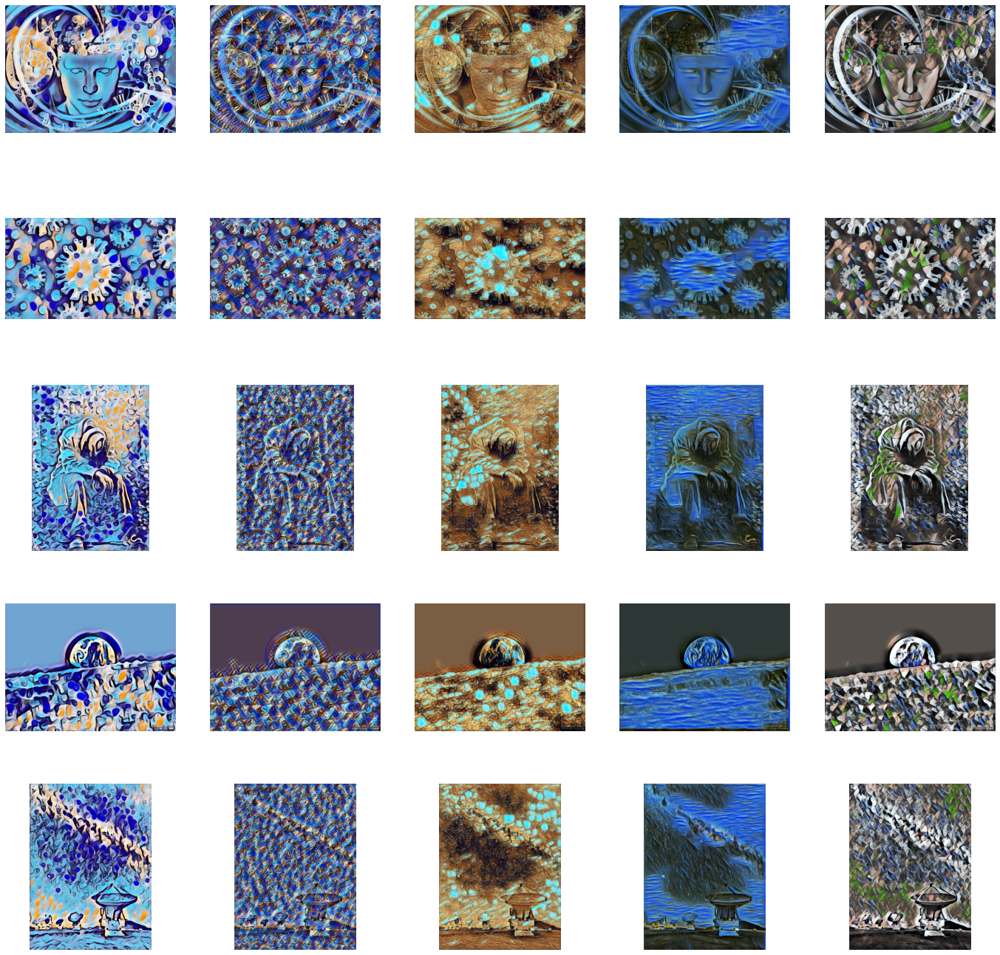

In [30]:
fig, axx = plt.subplots(5, 5, figsize=(24, 24))

for ax, img in zip(axx.flatten(), Transfer.fetch('art_image')):
    ax.imshow(img)
    ax.axis(False)

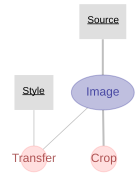

In [31]:
dj.Diagram(schema)

In [ ]:
Image.populate(display_progress=True)
Transfer.populate(display_progress=True)